In [1]:
import pandas as pd
import seaborn as sns
import numpy as np

In [2]:
df = pd.read_csv("pokemon_legendary.csv")
df.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [3]:
stat_cols = ["HP", "Attack", "Defense","Sp. Atk", "Sp. Def", "Speed"]
log_stats = df[stat_cols].apply(np.log)
log_stats.columns = [f"log_{s}" for s in stat_cols]
log_stats

,log_HP,log_Attack,log_Defense,log_Sp. Atk,log_Sp. Def,log_Speed
0,3.806662,3.891820,3.891820,4.174387,4.174387,3.806662
1,4.094345,4.127134,4.143135,4.382027,4.382027,4.094345
2,4.382027,4.406719,4.418841,4.605170,4.605170,4.382027
3,4.382027,4.605170,4.812184,4.804021,4.787492,4.382027
4,3.663562,3.951244,3.761200,4.094345,3.912023,4.174387
...,...,...,...,...,...,...
795,3.912023,4.605170,5.010635,4.605170,5.010635,3.912023
796,3.912023,5.075174,4.700480,5.075174,4.700480,4.700480
797,4.382027,4.700480,4.094345,5.010635,4.867534,4.248495
798,4.382027,5.075174,4.094345,5.135798,4.867534,4.382027


In [4]:
full_df = pd.concat([df,log_stats], axis=1)
full_df["Legendary"] = full_df["Legendary"].apply(int)
full_df

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary,log_HP,log_Attack,log_Defense,log_Sp. Atk,log_Sp. Def,log_Speed
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,0,3.806662,3.891820,3.891820,4.174387,4.174387,3.806662
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,0,4.094345,4.127134,4.143135,4.382027,4.382027,4.094345
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,0,4.382027,4.406719,4.418841,4.605170,4.605170,4.382027
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,0,4.382027,4.605170,4.812184,4.804021,4.787492,4.382027
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,0,3.663562,3.951244,3.761200,4.094345,3.912023,4.174387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,1,3.912023,4.605170,5.010635,4.605170,5.010635,3.912023
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,1,3.912023,5.075174,4.700480,5.075174,4.700480,4.700480
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,1,4.382027,4.700480,4.094345,5.010635,4.867534,4.248495
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,1,4.382027,5.075174,4.094345,5.135798,4.867534,4.382027


In [12]:
from sklearn.preprocessing import PowerTransformer

scaler = PowerTransformer(method="box-cox")
bc_cols = [f"bc_{s}" for s in stat_cols]
full_df[bc_cols] = scaler.fit_transform(df[stat_cols])

In [13]:
full_df

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,...,log_Defense,log_Sp. Atk,log_Sp. Def,log_Speed,bc_HP,bc_Attack,bc_Defense,bc_Sp. Atk,bc_Sp. Def,bc_Speed
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,...,3.891820,4.174387,4.174387,3.806662,-1.000917,-0.914732,-0.785061,-0.095816,-0.122421,-0.761752
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,...,4.143135,4.382027,4.382027,4.094345,-0.282544,-0.452045,-0.236860,0.362045,0.416094,-0.202100
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,...,4.418841,4.605170,4.605170,4.382027,0.523250,0.183348,0.422707,0.890645,1.033286,0.467590
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,...,4.812184,4.804021,4.787492,4.382027,0.523250,0.698845,1.481034,1.395914,1.569012,0.467590
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,...,3.761200,4.094345,3.912023,4.174387,-1.328679,-0.803594,-1.051499,-0.264045,-0.756806,-0.027674
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,...,5.010635,4.605170,5.010635,3.912023,-0.747343,0.698845,2.072912,0.890645,2.265657,-0.568343
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,...,4.700480,5.075174,4.700480,4.700480,-0.747343,2.175173,1.165526,2.141014,1.309701,1.363498
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,...,4.094345,5.010635,4.867534,4.248495,0.523250,0.967592,-0.347094,1.957529,1.813579,0.141774
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,...,4.094345,5.135798,4.867534,4.382027,0.523250,2.175173,-0.347094,2.316995,1.813579,0.467590


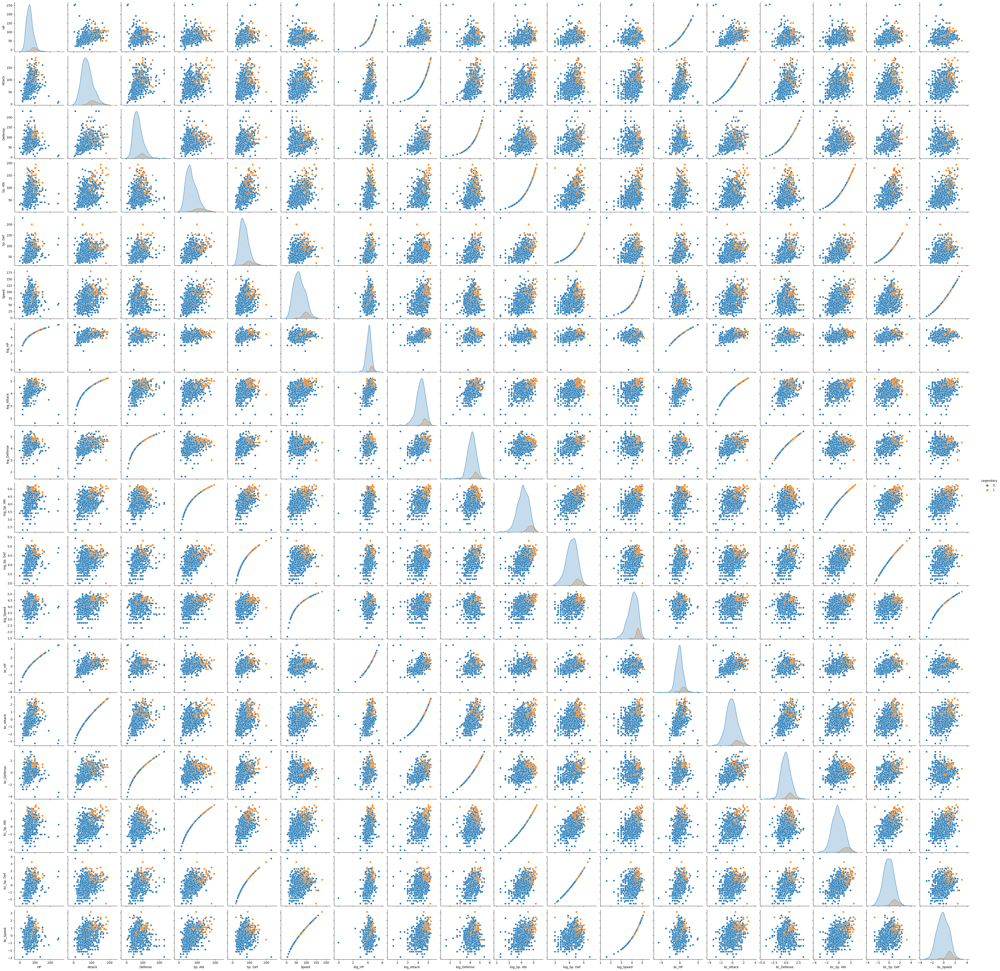

In [14]:
sns.pairplot(full_df[stat_cols + ["Legendary"] + log_stats.columns.to_list() + bc_cols], hue="Legendary")